# Add Geospatial Data for London

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd 
import geopandas as gpd
from glob import glob
from OSGridConverter import latlong2grid
import matplotlib.pyplot as plt 
from shapely.geometry import Point, Polygon
from geopandas import GeoDataFrame
import seaborn as sns
import altair as alt
import plotly.express as px

## 1. Load Greenspace Data

In [3]:
# read the files 
greenspace1 = gpd.read_file('/Users/florence/Desktop/citizen_science/additional_data/london/open_greenspace/OS Open Greenspace (ESRI Shape File) TQ/data/TQ_GreenspaceSite.shp')
greenspace2 = gpd.read_file('/Users/florence/Desktop/citizen_science/additional_data/london/open_greenspace/OS Open Greenspace (ESRI Shape File) TL/data/TL_GreenspaceSite.shp')
greenspace3 = gpd.read_file('/Users/florence/Desktop/citizen_science/additional_data/london/open_greenspace/OS Open Greenspace (ESRI Shape File) SU/data/SU_GreenspaceSite.shp')
greenspace4 = gpd.read_file('/Users/florence/Desktop/citizen_science/additional_data/london/open_greenspace/OS Open Greenspace (ESRI Shape File) SP/data/SP_GreenspaceSite.shp')

In [4]:
greenspace1.head()

,id,function,distName1,distName2,distName3,distName4,geometry
0,AC48C2C9-9043-7B2B-E053-A03BA40AE3D9,Playing Field,None,None,None,None,"POLYGON Z ((590269.480 194661.750 0.000, 59015..."
1,AC48C2C9-8EC0-7B2B-E053-A03BA40AE3D9,Religious Grounds,St Andrew's Church,None,None,None,"POLYGON Z ((590884.000 198901.540 0.000, 59088..."
2,AC48C2DD-1FAE-7B2B-E053-A03BA40AE3D9,Playing Field,None,None,None,None,"POLYGON Z ((590935.250 199521.030 0.000, 59090..."
3,AC48C232-76E1-7B2B-E053-A03BA40AE3D9,Play Space,None,None,None,None,"POLYGON Z ((590923.050 199605.960 0.000, 59091..."
4,AC48C22F-953B-7B2B-E053-A03BA40AE3D9,Play Space,None,None,None,None,"POLYGON Z ((590961.770 199617.990 0.000, 59095..."


In [5]:
# check coordinate reference system
greenspace1.crs

{'init': 'epsg:27700'}

In [6]:
def geometry_to_coords(df):
    df['Center_point'] = df['geometry'].centroid
    #Extract lat and lon from the centerpoint
    df["lat"] = df.Center_point.map(lambda p: p.x)
    df["long"] = df.Center_point.map(lambda p: p.y)

In [7]:
# concatenate all of them 
greenspace = pd.concat([greenspace1, greenspace2, greenspace3, greenspace4])
greenspace.head()

,id,function,distName1,distName2,distName3,distName4,geometry
0,AC48C2C9-9043-7B2B-E053-A03BA40AE3D9,Playing Field,None,None,None,None,"POLYGON Z ((590269.480 194661.750 0.000, 59015..."
1,AC48C2C9-8EC0-7B2B-E053-A03BA40AE3D9,Religious Grounds,St Andrew's Church,None,None,None,"POLYGON Z ((590884.000 198901.540 0.000, 59088..."
2,AC48C2DD-1FAE-7B2B-E053-A03BA40AE3D9,Playing Field,None,None,None,None,"POLYGON Z ((590935.250 199521.030 0.000, 59090..."
3,AC48C232-76E1-7B2B-E053-A03BA40AE3D9,Play Space,None,None,None,None,"POLYGON Z ((590923.050 199605.960 0.000, 59091..."
4,AC48C22F-953B-7B2B-E053-A03BA40AE3D9,Play Space,None,None,None,None,"POLYGON Z ((590961.770 199617.990 0.000, 59095..."


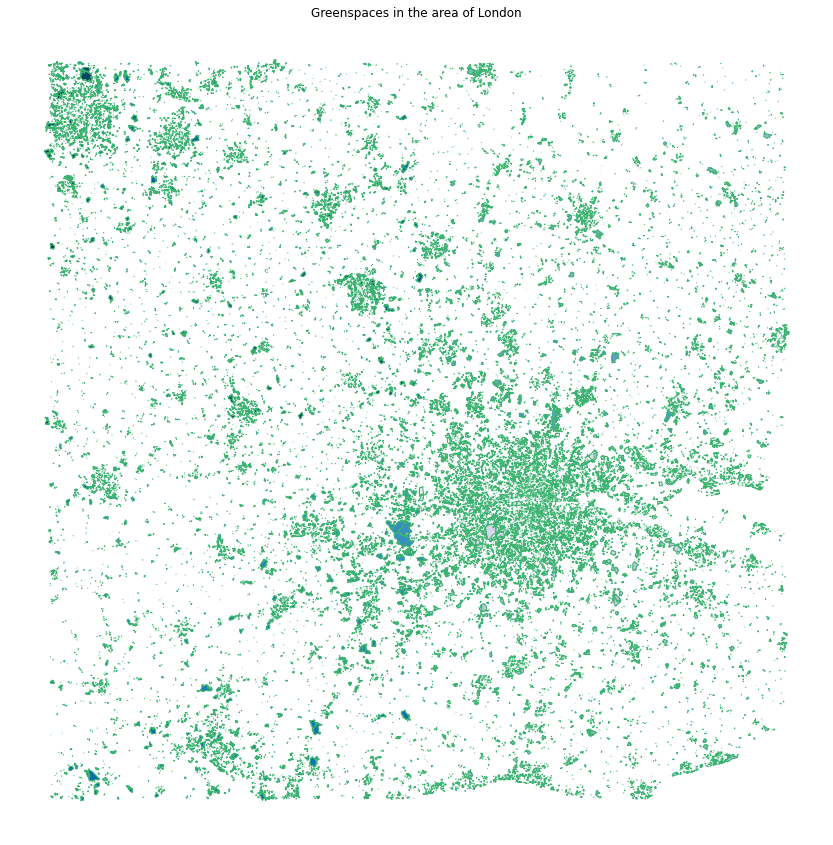

In [8]:
f, ax = plt.subplots(1, figsize=(15, 15))
greenspace.plot(ax=ax, cmap='PuBu', edgecolor='mediumseagreen')
ax.set_axis_off()
plt.title('Greenspaces in the area of London')
plt.show()

## 2. Load iNaturalist data (from London only)

In [9]:
data_folder = '/Users/florence/Desktop/citizen_science/muki_data'
london_df = pd.concat([pd.read_csv(f).assign(challenge=f.replace(".csv","")) for f in glob(data_folder+"/CNC London*.csv")])

In [10]:
london_df.columns

Index(['id', 'observed_on_string', 'observed_on', 'time_observed_at',
       'time_zone', 'user_id', 'user_login', 'created_at', 'updated_at',
       'quality_grade', 'license', 'url', 'image_url', 'sound_url', 'tag_list',
       'description', 'num_identification_agreements',
       'num_identification_disagreements', 'captive_cultivated',
       'oauth_application_id', 'place_guess', 'latitude', 'longitude',
       'positional_accuracy', 'geoprivacy', 'taxon_geoprivacy',
       'coordinates_obscured', 'positioning_method', 'positioning_device',
       'species_guess', 'scientific_name', 'common_name', 'iconic_taxon_name',
       'taxon_id', 'challenge'],
      dtype='object')

In [11]:
london_df[['longitude', 'latitude']].head()

,longitude,latitude
0,-0.190717,51.584130
1,-0.192392,51.586492
2,-0.153476,51.630852
3,0.094271,51.612413
4,0.041769,51.664052


### 2.1. Convert Longitude & Latitude to E & N from the OSGrid

In [12]:
es = []
ns = []
for i in range(len(london_df)):
    g=latlong2grid(london_df['latitude'].iloc[i],london_df['longitude'].iloc[i])
    es.append(g.E)
    ns.append(g.N)

In [13]:
london_df['E'] = es
london_df['N'] = ns
london_df.head()

,id,observed_on_string,observed_on,time_observed_at,time_zone,user_id,user_login,created_at,updated_at,quality_grade,...,positioning_method,positioning_device,species_guess,scientific_name,common_name,iconic_taxon_name,taxon_id,challenge,E,N
0,43032927,Fri Apr 24 2020 06:42:48 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:42:48 UTC,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:08 UTC,2020-04-28 08:44:05 UTC,needs_id,...,NaN,NaN,common hawthorn,Crataegus monogyna,common hawthorn,Plantae,51147.0,/Users/florence/Desktop/citizen_science/muki_d...,525451,188803
1,43032941,Fri Apr 24 2020 06:36:25 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:36:25 UTC,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:36 UTC,2020-05-01 15:01:25 UTC,research,...,NaN,NaN,Ramsons,Allium ursinum,Ramsons,Plantae,56152.0,/Users/florence/Desktop/citizen_science/muki_d...,525329,189063
2,43033780,Fri Apr 24 2020 07:11:24 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:11:24 UTC,Amsterdam,2777317,lynnebennett,2020-04-24 06:12:40 UTC,2020-04-30 12:47:10 UTC,research,...,NaN,NaN,carpet bugle,Ajuga reptans,Bugle,Plantae,56099.0,/Users/florence/Desktop/citizen_science/muki_d...,527900,194063
3,43035672,Fri Apr 24 2020 07:45:17 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:45:17 UTC,Amsterdam,1653354,helenfsc,2020-04-24 06:47:58 UTC,2020-04-24 06:48:41 UTC,research,...,NaN,NaN,Tarassaco comune,Taraxacum officinale,common dandelion,Plantae,47602.0,/Users/florence/Desktop/citizen_science/muki_d...,545104,192475
4,43036864,2020-04-24 7:36:12 AM GMT+01:00,2020-04-24,2020-04-24 05:36:12 UTC,Amsterdam,1488476,fsclondon,2020-04-24 07:05:13 UTC,2020-05-02 15:38:35 UTC,needs_id,...,gps,gps,Crane Flies,Tipulomorpha,Crane Flies,Insecta,179916.0,/Users/florence/Desktop/citizen_science/muki_d...,541309,198115


### 2.2. Add Greenspace-Column to iNaturalist data

In [14]:
geometry = [Point(xy) for xy in zip(london_df.E, london_df.N)]
new_df = london_df.drop(['E', 'N'], axis=1)
gdf = GeoDataFrame(new_df, crs="epsg:27700", geometry=geometry)

In [15]:
gdf.head()

,id,observed_on_string,observed_on,time_observed_at,time_zone,user_id,user_login,created_at,updated_at,quality_grade,...,coordinates_obscured,positioning_method,positioning_device,species_guess,scientific_name,common_name,iconic_taxon_name,taxon_id,challenge,geometry
0,43032927,Fri Apr 24 2020 06:42:48 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:42:48 UTC,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:08 UTC,2020-04-28 08:44:05 UTC,needs_id,...,False,NaN,NaN,common hawthorn,Crataegus monogyna,common hawthorn,Plantae,51147.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (525451.000 188803.000)
1,43032941,Fri Apr 24 2020 06:36:25 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:36:25 UTC,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:36 UTC,2020-05-01 15:01:25 UTC,research,...,False,NaN,NaN,Ramsons,Allium ursinum,Ramsons,Plantae,56152.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (525329.000 189063.000)
2,43033780,Fri Apr 24 2020 07:11:24 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:11:24 UTC,Amsterdam,2777317,lynnebennett,2020-04-24 06:12:40 UTC,2020-04-30 12:47:10 UTC,research,...,False,NaN,NaN,carpet bugle,Ajuga reptans,Bugle,Plantae,56099.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (527900.000 194063.000)
3,43035672,Fri Apr 24 2020 07:45:17 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:45:17 UTC,Amsterdam,1653354,helenfsc,2020-04-24 06:47:58 UTC,2020-04-24 06:48:41 UTC,research,...,True,NaN,NaN,Tarassaco comune,Taraxacum officinale,common dandelion,Plantae,47602.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (545104.000 192475.000)
4,43036864,2020-04-24 7:36:12 AM GMT+01:00,2020-04-24,2020-04-24 05:36:12 UTC,Amsterdam,1488476,fsclondon,2020-04-24 07:05:13 UTC,2020-05-02 15:38:35 UTC,needs_id,...,False,gps,gps,Crane Flies,Tipulomorpha,Crane Flies,Insecta,179916.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (541309.000 198115.000)


In [16]:
# join greenspace and London data
points_polys = gpd.sjoin(gdf, greenspace, how="inner") 

/Users/florence/opt/anaconda3/envs/data_analysis/lib/python3.8/site-packages/geopandas/tools/sjoin.py:58: UserWarning: CRS of frames being joined does not match!(epsg:27700 != {'init': 'epsg:27700'})
  warn(


In [17]:
points_polys.columns

Index(['id_left', 'observed_on_string', 'observed_on', 'time_observed_at',
       'time_zone', 'user_id', 'user_login', 'created_at', 'updated_at',
       'quality_grade', 'license', 'url', 'image_url', 'sound_url', 'tag_list',
       'description', 'num_identification_agreements',
       'num_identification_disagreements', 'captive_cultivated',
       'oauth_application_id', 'place_guess', 'latitude', 'longitude',
       'positional_accuracy', 'geoprivacy', 'taxon_geoprivacy',
       'coordinates_obscured', 'positioning_method', 'positioning_device',
       'species_guess', 'scientific_name', 'common_name', 'iconic_taxon_name',
       'taxon_id', 'challenge', 'geometry', 'index_right', 'id_right',
       'function', 'distName1', 'distName2', 'distName3', 'distName4'],
      dtype='object')

In [18]:
points_polys.head()

,id_left,observed_on_string,observed_on,time_observed_at,time_zone,user_id,user_login,created_at,updated_at,quality_grade,...,taxon_id,challenge,geometry,index_right,id_right,function,distName1,distName2,distName3,distName4
43,43048184,Fri Apr 24 2020 10:48:01 GMT+0100 (GMT+1),2020-04-24,2020-04-24 08:48:01 UTC,Amsterdam,2814937,ethanjackson13,2020-04-24 09:48:28 UTC,2020-04-28 08:50:05 UTC,casual,...,47407.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (529617.000 193689.000),1298,AC48C27B-2DFA-7B2B-E053-A03BA40AE3D9,Playing Field,The Walker Cricket Ground,None,None,None
44,43048298,Fri Apr 24 2020 10:49:40 GMT+0100 (GMT+1),2020-04-24,2020-04-24 08:49:40 UTC,Amsterdam,2814937,ethanjackson13,2020-04-24 09:50:06 UTC,2020-04-28 08:50:42 UTC,casual,...,51267.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (529693.000 193700.000),1298,AC48C27B-2DFA-7B2B-E053-A03BA40AE3D9,Playing Field,The Walker Cricket Ground,None,None,None
46,43048656,Fri Apr 24 2020 10:55:36 GMT+0100 (GMT+1),2020-04-24,2020-04-24 08:55:36 UTC,Amsterdam,2814937,ethanjackson13,2020-04-24 09:55:51 UTC,2020-04-24 09:56:00 UTC,needs_id,...,53350.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (529674.000 193576.000),1298,AC48C27B-2DFA-7B2B-E053-A03BA40AE3D9,Playing Field,The Walker Cricket Ground,None,None,None
48,43049097,Fri Apr 24 2020 11:01:56 GMT+0100 (GMT+1),2020-04-24,2020-04-24 09:01:56 UTC,Amsterdam,2814937,ethanjackson13,2020-04-24 10:02:26 UTC,2020-04-24 11:42:18 UTC,research,...,464103.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (529617.000 193446.000),1298,AC48C27B-2DFA-7B2B-E053-A03BA40AE3D9,Playing Field,The Walker Cricket Ground,None,None,None
53,43049332,Fri Apr 24 2020 11:05:26 GMT+0100 (GMT+1),2020-04-24,2020-04-24 09:05:26 UTC,Amsterdam,2814937,ethanjackson13,2020-04-24 10:05:36 UTC,2020-04-24 10:06:17 UTC,casual,...,47374.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (529500.000 193524.000),1298,AC48C27B-2DFA-7B2B-E053-A03BA40AE3D9,Playing Field,The Walker Cricket Ground,None,None,None


In [19]:
ids_with_greenspace = points_polys.id_left.to_list()

In [20]:
# set Flag for greenspace in the iNaturalist DataFrame 
new_london = london_df.set_index('id')
new_london.head()

,observed_on_string,observed_on,time_observed_at,time_zone,user_id,user_login,created_at,updated_at,quality_grade,license,...,positioning_method,positioning_device,species_guess,scientific_name,common_name,iconic_taxon_name,taxon_id,challenge,E,N
id,,,,,,,,,,,,,,,,,,,,,
43032927,Fri Apr 24 2020 06:42:48 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:42:48 UTC,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:08 UTC,2020-04-28 08:44:05 UTC,needs_id,NaN,...,NaN,NaN,common hawthorn,Crataegus monogyna,common hawthorn,Plantae,51147.0,/Users/florence/Desktop/citizen_science/muki_d...,525451,188803
43032941,Fri Apr 24 2020 06:36:25 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:36:25 UTC,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:36 UTC,2020-05-01 15:01:25 UTC,research,NaN,...,NaN,NaN,Ramsons,Allium ursinum,Ramsons,Plantae,56152.0,/Users/florence/Desktop/citizen_science/muki_d...,525329,189063
43033780,Fri Apr 24 2020 07:11:24 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:11:24 UTC,Amsterdam,2777317,lynnebennett,2020-04-24 06:12:40 UTC,2020-04-30 12:47:10 UTC,research,CC-BY-NC,...,NaN,NaN,carpet bugle,Ajuga reptans,Bugle,Plantae,56099.0,/Users/florence/Desktop/citizen_science/muki_d...,527900,194063
43035672,Fri Apr 24 2020 07:45:17 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:45:17 UTC,Amsterdam,1653354,helenfsc,2020-04-24 06:47:58 UTC,2020-04-24 06:48:41 UTC,research,CC-BY-NC,...,NaN,NaN,Tarassaco comune,Taraxacum officinale,common dandelion,Plantae,47602.0,/Users/florence/Desktop/citizen_science/muki_d...,545104,192475
43036864,2020-04-24 7:36:12 AM GMT+01:00,2020-04-24,2020-04-24 05:36:12 UTC,Amsterdam,1488476,fsclondon,2020-04-24 07:05:13 UTC,2020-05-02 15:38:35 UTC,needs_id,CC-BY-NC,...,gps,gps,Crane Flies,Tipulomorpha,Crane Flies,Insecta,179916.0,/Users/florence/Desktop/citizen_science/muki_d...,541309,198115


In [21]:
new_london['greenspace_flag'] = '0'
new_london.loc[ids_with_greenspace,'greenspace_flag'] = '1'

In [22]:
new_london.head()

,observed_on_string,observed_on,time_observed_at,time_zone,user_id,user_login,created_at,updated_at,quality_grade,license,...,positioning_device,species_guess,scientific_name,common_name,iconic_taxon_name,taxon_id,challenge,E,N,greenspace_flag
id,,,,,,,,,,,,,,,,,,,,,
43032927,Fri Apr 24 2020 06:42:48 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:42:48 UTC,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:08 UTC,2020-04-28 08:44:05 UTC,needs_id,NaN,...,NaN,common hawthorn,Crataegus monogyna,common hawthorn,Plantae,51147.0,/Users/florence/Desktop/citizen_science/muki_d...,525451,188803,0
43032941,Fri Apr 24 2020 06:36:25 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:36:25 UTC,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:36 UTC,2020-05-01 15:01:25 UTC,research,NaN,...,NaN,Ramsons,Allium ursinum,Ramsons,Plantae,56152.0,/Users/florence/Desktop/citizen_science/muki_d...,525329,189063,0
43033780,Fri Apr 24 2020 07:11:24 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:11:24 UTC,Amsterdam,2777317,lynnebennett,2020-04-24 06:12:40 UTC,2020-04-30 12:47:10 UTC,research,CC-BY-NC,...,NaN,carpet bugle,Ajuga reptans,Bugle,Plantae,56099.0,/Users/florence/Desktop/citizen_science/muki_d...,527900,194063,0
43035672,Fri Apr 24 2020 07:45:17 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:45:17 UTC,Amsterdam,1653354,helenfsc,2020-04-24 06:47:58 UTC,2020-04-24 06:48:41 UTC,research,CC-BY-NC,...,NaN,Tarassaco comune,Taraxacum officinale,common dandelion,Plantae,47602.0,/Users/florence/Desktop/citizen_science/muki_d...,545104,192475,0
43036864,2020-04-24 7:36:12 AM GMT+01:00,2020-04-24,2020-04-24 05:36:12 UTC,Amsterdam,1488476,fsclondon,2020-04-24 07:05:13 UTC,2020-05-02 15:38:35 UTC,needs_id,CC-BY-NC,...,gps,Crane Flies,Tipulomorpha,Crane Flies,Insecta,179916.0,/Users/florence/Desktop/citizen_science/muki_d...,541309,198115,0


In [23]:
new_london.greenspace_flag.value_counts()

0    8235
1    5495
Name: greenspace_flag, dtype: int64

### 2.3. Calculate distances from observation points to greenspace polygons

Calculate the minimum distance from an observation-point to a greenspace-polygon (how far is the location of the observation away from the next greenspace?):

In [25]:
def min_distance(point, lines):
    return lines.distance(point).min()

if False:
    gdf['min_dist_to_greenspace'] = gdf.geometry.apply(min_distance, args=(greenspace.geometry,))

## 3. Read Bluespace-Shapefiles

In [24]:
bluespace = gpd.read_file('/Users/florence/Desktop/citizen_science/additional_data/london/open_bluespace/data/WatercourseLink.shp')

In [25]:
bluespace.head()

,name1,identifier,startNode,endNode,form,flow,fictitious,length,name2,geometry
0,Burn of Skaw,65587873-6B4A-49A0-9000-20CC7D38C033,3C4DB5F6-FF49-4379-9BED-1C96D4FD7D96,630A2DCB-C0B1-49CD-9C08-F24AB6735F71,inlandRiver,in direction,false,1696,None,"LINESTRING Z (464604.980 1216285.950 0.000, 46..."
1,Burn of Norwick,2D0AB017-BA69-40A6-9DF2-43FF5A81BEED,E6B7CA22-58B6-4936-B419-1D1F07E19D6F,B9E9254B-AE8C-4457-9C8C-904D8662AA43,inlandRiver,in direction,false,559,None,"LINESTRING Z (464632.760 1214060.700 0.000, 46..."
2,None,643C587F-D1EF-438D-B520-7C0F405EA896,6AABC603-5B84-4BFC-8BCC-06D243219996,B9E9254B-AE8C-4457-9C8C-904D8662AA43,inlandRiver,in direction,false,96,None,"LINESTRING Z (464782.250 1214486.580 0.000, 46..."
3,None,8CA995C7-FFC6-4E2A-AB16-B16C318C2EA1,BF6A5053-7DC6-4735-8206-072A271BB188,236B5EFF-F0DD-4607-9747-B953F7A2A129,inlandRiver,in direction,false,317,None,"LINESTRING Z (464897.380 1214802.590 0.000, 46..."
4,Burn of Norwick,79A8711A-05A9-4C1D-B011-F05A8E410C97,B9E9254B-AE8C-4457-9C8C-904D8662AA43,236B5EFF-F0DD-4607-9747-B953F7A2A129,inlandRiver,in direction,false,49,None,"LINESTRING Z (464876.250 1214469.160 0.000, 46..."


In [26]:
bluespace.geometry

0         LINESTRING Z (464604.980 1216285.950 0.000, 46...
1         LINESTRING Z (464632.760 1214060.700 0.000, 46...
2         LINESTRING Z (464782.250 1214486.580 0.000, 46...
3         LINESTRING Z (464897.380 1214802.590 0.000, 46...
4         LINESTRING Z (464876.250 1214469.160 0.000, 46...
                                ...                        
186250    LINESTRING Z (142067.430 33538.460 0.000, 1420...
186251    LINESTRING Z (142461.010 34188.040 0.000, 1423...
186252    LINESTRING Z (145424.720 35748.270 0.000, 1454...
186253    LINESTRING Z (139378.670 35449.550 0.000, 1393...
186254    LINESTRING Z (143070.370 37026.090 0.000, 1430...
Name: geometry, Length: 186255, dtype: geometry

In [27]:
bluespace.crs

{'init': 'epsg:27700'}

In [30]:
greenspace.crs

{'init': 'epsg:27700'}

In [29]:
bluespace_points = gpd.sjoin(gdf, bluespace, how="inner") 

/Users/florence/opt/anaconda3/envs/data_analysis/lib/python3.8/site-packages/geopandas/tools/sjoin.py:58: UserWarning: CRS of frames being joined does not match!(epsg:27700 != {'init': 'epsg:27700'})
  warn(


In [33]:
new_london.columns

Index(['observed_on_string', 'observed_on', 'time_observed_at', 'time_zone',
       'user_id', 'user_login', 'created_at', 'updated_at', 'quality_grade',
       'license', 'url', 'image_url', 'sound_url', 'tag_list', 'description',
       'num_identification_agreements', 'num_identification_disagreements',
       'captive_cultivated', 'oauth_application_id', 'place_guess', 'latitude',
       'longitude', 'positional_accuracy', 'geoprivacy', 'taxon_geoprivacy',
       'coordinates_obscured', 'positioning_method', 'positioning_device',
       'species_guess', 'scientific_name', 'common_name', 'iconic_taxon_name',
       'taxon_id', 'challenge', 'E', 'N', 'greenspace_flag'],
      dtype='object')

Do the same distance calculation for the bluespace data as we did for the greenspace data in order to check how far the next bluespace is from the observation location:

In [32]:
if False: 
    gdf['min_dist_to_bluespace'] = gdf.geometry.apply(min_distance, args=(bluespace.geometry,))

In [33]:
if False: 
    gdf.to_csv('/Users/florence/Desktop/citizen_science/joined_data.csv')

In [34]:
new_london.to_csv('london_data_with_greenspace_flag.csv')

## 4. Load newly created DataFrame

In [34]:
joined_data = pd.read_csv('/Users/florence/Desktop/citizen_science/joined_data.csv', index_col=0)

In [35]:
joined_data.head()

,id,observed_on_string,observed_on,time_observed_at,time_zone,user_id,user_login,created_at,updated_at,quality_grade,...,positioning_device,species_guess,scientific_name,common_name,iconic_taxon_name,taxon_id,challenge,geometry,min_dist_to_greenspace,min_dist_to_bluespace
0,43032927,Fri Apr 24 2020 06:42:48 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:42:48 UTC,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:08 UTC,2020-04-28 08:44:05 UTC,needs_id,...,NaN,common hawthorn,Crataegus monogyna,common hawthorn,Plantae,51147.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (525451 188803),69.467690,1442.099763
1,43032941,Fri Apr 24 2020 06:36:25 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:36:25 UTC,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:36 UTC,2020-05-01 15:01:25 UTC,research,...,NaN,Ramsons,Allium ursinum,Ramsons,Plantae,56152.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (525329 189063),96.135321,1276.338777
2,43033780,Fri Apr 24 2020 07:11:24 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:11:24 UTC,Amsterdam,2777317,lynnebennett,2020-04-24 06:12:40 UTC,2020-04-30 12:47:10 UTC,research,...,NaN,carpet bugle,Ajuga reptans,Bugle,Plantae,56099.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (527900 194063),373.548725,496.550008
3,43035672,Fri Apr 24 2020 07:45:17 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:45:17 UTC,Amsterdam,1653354,helenfsc,2020-04-24 06:47:58 UTC,2020-04-24 06:48:41 UTC,research,...,NaN,Tarassaco comune,Taraxacum officinale,common dandelion,Plantae,47602.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (545104 192475),117.303361,819.395954
4,43036864,2020-04-24 7:36:12 AM GMT+01:00,2020-04-24,2020-04-24 05:36:12 UTC,Amsterdam,1488476,fsclondon,2020-04-24 07:05:13 UTC,2020-05-02 15:38:35 UTC,needs_id,...,gps,Crane Flies,Tipulomorpha,Crane Flies,Insecta,179916.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (541309 198115),548.408789,654.755189


In [36]:
# set Flag for greenspace in the iNaturalist DataFrame 
new_joined = joined_data.set_index('id')
new_joined.head()

,observed_on_string,observed_on,time_observed_at,time_zone,user_id,user_login,created_at,updated_at,quality_grade,license,...,positioning_device,species_guess,scientific_name,common_name,iconic_taxon_name,taxon_id,challenge,geometry,min_dist_to_greenspace,min_dist_to_bluespace
id,,,,,,,,,,,,,,,,,,,,,
43032927,Fri Apr 24 2020 06:42:48 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:42:48 UTC,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:08 UTC,2020-04-28 08:44:05 UTC,needs_id,NaN,...,NaN,common hawthorn,Crataegus monogyna,common hawthorn,Plantae,51147.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (525451 188803),69.467690,1442.099763
43032941,Fri Apr 24 2020 06:36:25 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:36:25 UTC,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:36 UTC,2020-05-01 15:01:25 UTC,research,NaN,...,NaN,Ramsons,Allium ursinum,Ramsons,Plantae,56152.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (525329 189063),96.135321,1276.338777
43033780,Fri Apr 24 2020 07:11:24 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:11:24 UTC,Amsterdam,2777317,lynnebennett,2020-04-24 06:12:40 UTC,2020-04-30 12:47:10 UTC,research,CC-BY-NC,...,NaN,carpet bugle,Ajuga reptans,Bugle,Plantae,56099.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (527900 194063),373.548725,496.550008
43035672,Fri Apr 24 2020 07:45:17 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:45:17 UTC,Amsterdam,1653354,helenfsc,2020-04-24 06:47:58 UTC,2020-04-24 06:48:41 UTC,research,CC-BY-NC,...,NaN,Tarassaco comune,Taraxacum officinale,common dandelion,Plantae,47602.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (545104 192475),117.303361,819.395954
43036864,2020-04-24 7:36:12 AM GMT+01:00,2020-04-24,2020-04-24 05:36:12 UTC,Amsterdam,1488476,fsclondon,2020-04-24 07:05:13 UTC,2020-05-02 15:38:35 UTC,needs_id,CC-BY-NC,...,gps,Crane Flies,Tipulomorpha,Crane Flies,Insecta,179916.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (541309 198115),548.408789,654.755189


In [37]:
new_joined['greenspace_flag'] = '0'
new_joined.loc[ids_with_greenspace,'greenspace_flag'] = '1'

In [38]:
new_joined.greenspace_flag.value_counts()

0    8235
1    5495
Name: greenspace_flag, dtype: int64

In [39]:
new_joined['min_dist_to_bluespace'] = new_joined['min_dist_to_bluespace']/1000.0 # to get distance in km and not meters

In [40]:
new_joined['min_dist_to_greenspace'] = new_joined['min_dist_to_greenspace']/1000.0

In [41]:
new_joined.head()

,observed_on_string,observed_on,time_observed_at,time_zone,user_id,user_login,created_at,updated_at,quality_grade,license,...,species_guess,scientific_name,common_name,iconic_taxon_name,taxon_id,challenge,geometry,min_dist_to_greenspace,min_dist_to_bluespace,greenspace_flag
id,,,,,,,,,,,,,,,,,,,,,
43032927,Fri Apr 24 2020 06:42:48 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:42:48 UTC,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:08 UTC,2020-04-28 08:44:05 UTC,needs_id,NaN,...,common hawthorn,Crataegus monogyna,common hawthorn,Plantae,51147.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (525451 188803),0.069468,1.442100,0
43032941,Fri Apr 24 2020 06:36:25 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:36:25 UTC,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:36 UTC,2020-05-01 15:01:25 UTC,research,NaN,...,Ramsons,Allium ursinum,Ramsons,Plantae,56152.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (525329 189063),0.096135,1.276339,0
43033780,Fri Apr 24 2020 07:11:24 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:11:24 UTC,Amsterdam,2777317,lynnebennett,2020-04-24 06:12:40 UTC,2020-04-30 12:47:10 UTC,research,CC-BY-NC,...,carpet bugle,Ajuga reptans,Bugle,Plantae,56099.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (527900 194063),0.373549,0.496550,0
43035672,Fri Apr 24 2020 07:45:17 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:45:17 UTC,Amsterdam,1653354,helenfsc,2020-04-24 06:47:58 UTC,2020-04-24 06:48:41 UTC,research,CC-BY-NC,...,Tarassaco comune,Taraxacum officinale,common dandelion,Plantae,47602.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (545104 192475),0.117303,0.819396,0
43036864,2020-04-24 7:36:12 AM GMT+01:00,2020-04-24,2020-04-24 05:36:12 UTC,Amsterdam,1488476,fsclondon,2020-04-24 07:05:13 UTC,2020-05-02 15:38:35 UTC,needs_id,CC-BY-NC,...,Crane Flies,Tipulomorpha,Crane Flies,Insecta,179916.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (541309 198115),0.548409,0.654755,0


## 5. Group new DataFrame by users and check correlation between number of observations and distance from greenspace/bluespace

In [42]:
grouped_users = new_joined.groupby('user_id').quality_grade.count()
grouped_users = grouped_users.to_frame()
grouped_users.rename(columns={'quality_grade':'num_obs'}, inplace=True)
grouped_users.head()

,num_obs
user_id,
484,15
1245,2
1439,2
2111,2
13244,3


In [43]:
# get mean distance to greenspace for each user
grouped_greenspace = new_joined.groupby('user_id').min_dist_to_greenspace.mean()
grouped_greenspace = grouped_greenspace.to_frame()
grouped_greenspace.rename(columns={'min_dist_to_greenspace':'mean_green_dist'}, inplace=True)
grouped_greenspace.head()

,mean_green_dist
user_id,
484,0.084203
1245,0.070517
1439,0.139881
2111,0.567320
13244,0.412155


In [44]:
# get mean distance to greenspace for each user
grouped_bluespace = new_joined.groupby('user_id').min_dist_to_bluespace.mean()
grouped_bluespace = grouped_bluespace.to_frame()
grouped_bluespace.rename(columns={'min_dist_to_bluespace':'mean_blue_dist'}, inplace=True)
grouped_bluespace.head()

,mean_blue_dist
user_id,
484,0.178463
1245,0.803926
1439,0.245318
2111,0.684608
13244,0.973430


In [45]:
joined_df = pd.concat([grouped_users, grouped_greenspace, grouped_bluespace], axis=1)

In [46]:
joined_df.head()

,num_obs,mean_green_dist,mean_blue_dist
user_id,,,
484,15,0.084203,0.178463
1245,2,0.070517,0.803926
1439,2,0.139881,0.245318
2111,2,0.567320,0.684608
13244,3,0.412155,0.973430


<AxesSubplot:>

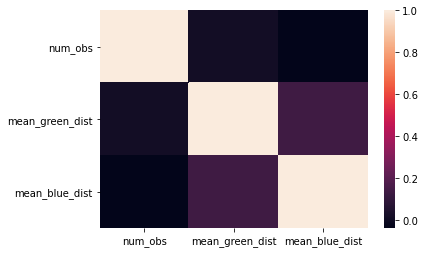

In [47]:
corr = joined_df.corr()
# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [48]:
new_joined.columns

Index(['observed_on_string', 'observed_on', 'time_observed_at', 'time_zone',
       'user_id', 'user_login', 'created_at', 'updated_at', 'quality_grade',
       'license', 'url', 'image_url', 'sound_url', 'tag_list', 'description',
       'num_identification_agreements', 'num_identification_disagreements',
       'captive_cultivated', 'oauth_application_id', 'place_guess', 'latitude',
       'longitude', 'positional_accuracy', 'geoprivacy', 'taxon_geoprivacy',
       'coordinates_obscured', 'positioning_method', 'positioning_device',
       'species_guess', 'scientific_name', 'common_name', 'iconic_taxon_name',
       'taxon_id', 'challenge', 'geometry', 'min_dist_to_greenspace',
       'min_dist_to_bluespace', 'greenspace_flag'],
      dtype='object')

In [51]:
len(new_joined.taxon_id.unique())

2462

In [52]:
new_joined.iconic_taxon_name.unique()

array(['Plantae', 'Insecta', 'Aves', 'Mammalia', 'Arachnida', nan,
       'Mollusca', 'Fungi', 'Animalia', 'Amphibia', 'Actinopterygii',
       'Protozoa', 'Reptilia'], dtype=object)

In [ ]:
## correlation für kategorische Features checken 

## 6. Plot Observations by `iconic_taxon_name`

In [60]:
new_joined.time_observed_at = pd.to_datetime(new_joined.time_observed_at)
new_joined.observed_on = pd.to_datetime(new_joined.observed_on)
new_joined.created_at = pd.to_datetime(new_joined.created_at)
new_joined.updated_at = pd.to_datetime(new_joined.updated_at)

In [61]:
new_joined.time_observed_at.min()

Timestamp('2018-04-27 06:34:31+0000', tz='UTC')

In [62]:
new_joined.time_observed_at.max()

Timestamp('2020-04-27 22:17:07+0000', tz='UTC')

In [63]:
new_joined.head()

,observed_on_string,observed_on,time_observed_at,time_zone,user_id,user_login,created_at,updated_at,quality_grade,license,...,species_guess,scientific_name,common_name,iconic_taxon_name,taxon_id,challenge,geometry,min_dist_to_greenspace,min_dist_to_bluespace,greenspace_flag
id,,,,,,,,,,,,,,,,,,,,,
43032927,Fri Apr 24 2020 06:42:48 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:42:48+00:00,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:08+00:00,2020-04-28 08:44:05+00:00,needs_id,NaN,...,common hawthorn,Crataegus monogyna,common hawthorn,Plantae,51147.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (525451 188803),0.069468,1.442100,0
43032941,Fri Apr 24 2020 06:36:25 GMT+0100 (GMT+1),2020-04-24,2020-04-24 04:36:25+00:00,Amsterdam,2295352,louisebrown1,2020-04-24 05:59:36+00:00,2020-05-01 15:01:25+00:00,research,NaN,...,Ramsons,Allium ursinum,Ramsons,Plantae,56152.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (525329 189063),0.096135,1.276339,0
43033780,Fri Apr 24 2020 07:11:24 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:11:24+00:00,Amsterdam,2777317,lynnebennett,2020-04-24 06:12:40+00:00,2020-04-30 12:47:10+00:00,research,CC-BY-NC,...,carpet bugle,Ajuga reptans,Bugle,Plantae,56099.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (527900 194063),0.373549,0.496550,0
43035672,Fri Apr 24 2020 07:45:17 GMT+0100 (GMT+1),2020-04-24,2020-04-24 05:45:17+00:00,Amsterdam,1653354,helenfsc,2020-04-24 06:47:58+00:00,2020-04-24 06:48:41+00:00,research,CC-BY-NC,...,Tarassaco comune,Taraxacum officinale,common dandelion,Plantae,47602.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (545104 192475),0.117303,0.819396,0
43036864,2020-04-24 7:36:12 AM GMT+01:00,2020-04-24,2020-04-24 05:36:12+00:00,Amsterdam,1488476,fsclondon,2020-04-24 07:05:13+00:00,2020-05-02 15:38:35+00:00,needs_id,CC-BY-NC,...,Crane Flies,Tipulomorpha,Crane Flies,Insecta,179916.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (541309 198115),0.548409,0.654755,0


In [64]:
new_joined.columns

Index(['observed_on_string', 'observed_on', 'time_observed_at', 'time_zone',
       'user_id', 'user_login', 'created_at', 'updated_at', 'quality_grade',
       'license', 'url', 'image_url', 'sound_url', 'tag_list', 'description',
       'num_identification_agreements', 'num_identification_disagreements',
       'captive_cultivated', 'oauth_application_id', 'place_guess', 'latitude',
       'longitude', 'positional_accuracy', 'geoprivacy', 'taxon_geoprivacy',
       'coordinates_obscured', 'positioning_method', 'positioning_device',
       'species_guess', 'scientific_name', 'common_name', 'iconic_taxon_name',
       'taxon_id', 'challenge', 'geometry', 'min_dist_to_greenspace',
       'min_dist_to_bluespace', 'greenspace_flag'],
      dtype='object')

### 6.1. all three years

In [74]:
new_joined['year'] = 0

In [97]:
new_joined.set_index('observed_on', inplace=True)

In [81]:
new_joined.loc[(new_joined.index.year.isin([2018])), 'year'] = 2018
new_joined.loc[(new_joined.index.year.isin([2019])), 'year'] = 2019
new_joined.loc[(new_joined.index.year.isin([2020])), 'year'] = 2020

In [83]:
new_joined.dropna(subset=['iconic_taxon_name'], inplace=True)

In [85]:
new_joined.sort_values(by=['year'], inplace=True)

In [100]:
new_joined.to_csv('/Users/florence/Desktop/citizen_science/citizen_science_inaturalist/notebooks/spatial_group/joined_london_data.csv')

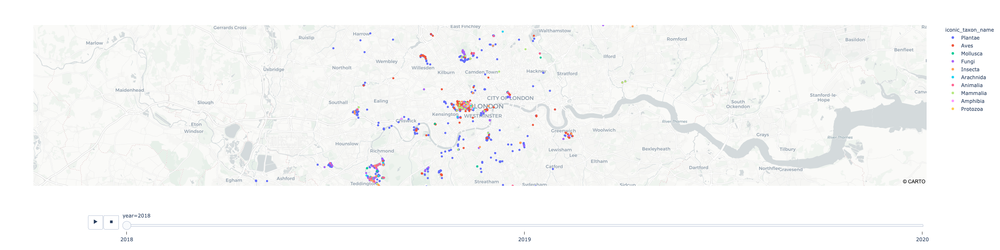

In [86]:
fig = px.scatter_mapbox(new_joined, lat="latitude", lon="longitude", zoom=10, color='iconic_taxon_name', mapbox_style="carto-positron", animation_frame='year', height=600, hover_name='common_name')
fig.show()

## 7. Clustering Data with K-Means

### 7.1. Elbow Curve first:

In [87]:
from sklearn.cluster import KMeans

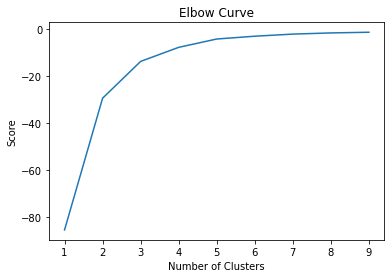

In [88]:
K_clusters = range(1,10)
kmeans = [KMeans(n_clusters=i) for i in K_clusters]
Y_axis = new_joined[['latitude']]
X_axis = new_joined[['longitude']]
score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]

# Visualize
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

4 Clusters seem to be a good choice.

In [91]:
X=new_joined.loc[:,['iconic_taxon_name','latitude','longitude', 'year', 'common_name']]

In [95]:
kmeans = KMeans(n_clusters = 8, init ='k-means++')
kmeans.fit(X[X.columns[1:3]]) # Compute k-means clustering.
X['cluster_label'] = kmeans.fit_predict(X[X.columns[1:3]])
centers = kmeans.cluster_centers_ # Coordinates of cluster centers.
labels = kmeans.predict(X[X.columns[1:3]]) # Labels of each point
X.head(10)

,iconic_taxon_name,latitude,longitude,year,common_name,cluster_label
observed_on,,,,,,
2018-04-29,Plantae,51.509067,-0.188106,2018,bamboos,5
2018-04-28,Plantae,51.506382,-0.194776,2018,wisterias,5
2018-04-28,Aves,51.445555,-0.317675,2018,Carrion Crow,0
2018-04-28,Aves,51.560953,-0.155585,2018,Mallard,1
2018-04-28,Aves,51.435508,-0.309758,2018,Great Cormorant,0
2018-04-28,Aves,51.561589,-0.155377,2018,Eurasian Coot,1
2018-04-28,Plantae,51.435825,-0.307158,2018,geraniums and cranesbills,0
2018-04-28,Aves,51.435537,-0.309505,2018,Egyptian Goose,0
2018-04-28,Mollusca,51.443413,-0.327928,2018,Zebra Mussel,0


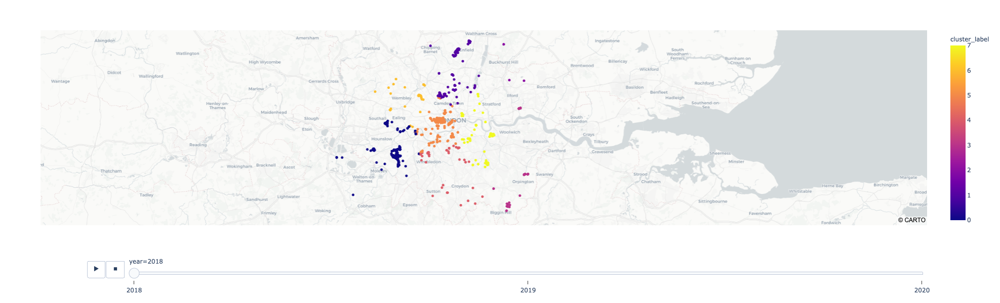

In [96]:
fig = px.scatter_mapbox(X, lat="latitude", lon="longitude", zoom=10, color='cluster_label', mapbox_style="carto-positron", animation_frame='year', height=600, hover_name='iconic_taxon_name')
fig.show()

## 8. Correlations

In [104]:
new_joined.head()

,observed_on_string,time_observed_at,time_zone,user_id,user_login,created_at,updated_at,quality_grade,license,url,...,scientific_name,common_name,iconic_taxon_name,taxon_id,challenge,geometry,min_dist_to_greenspace,min_dist_to_bluespace,greenspace_flag,year
observed_on,,,,,,,,,,,,,,,,,,,,,
2018-04-29,Sun Apr 29 2018 11:07:52 GMT+0100 (GMT+1),2018-04-29 09:07:52+00:00,Amsterdam,908569,fieldmarshal,2018-04-29 10:08:44+00:00,2018-04-29 10:08:56+00:00,casual,NaN,https://www.inaturalist.org/observations/11728634,...,Bambusoideae,bamboos,Plantae,201656.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (525839 180460),0.000000,0.887651,1,2018
2018-04-28,2018-04-28 2:40:20 pm BST,2018-04-28 14:40:20+00:00,UTC,911227,biologykate,2018-04-28 13:41:09+00:00,2018-04-28 13:41:17+00:00,casual,CC-BY,https://www.inaturalist.org/observations/11599594,...,Wisteria,wisterias,Plantae,51267.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (525383 180150),0.195287,1.385144,0,2018
2018-04-28,Sat Apr 28 2018 11:15:24 GMT+0100 (GMT+1),2018-04-28 09:15:24+00:00,Amsterdam,353381,wildhamandpetersham,2018-04-28 13:38:07+00:00,2018-04-28 14:11:21+00:00,research,CC-BY-NC-ND,https://www.inaturalist.org/observations/11599335,...,Corvus corone,Carrion Crow,Aves,204496.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (517010 173182),0.083983,0.062099,0,2018
2018-04-28,Sat Apr 28 2018 14:37:14 GMT+0100 (GMT+1),2018-04-28 12:37:14+00:00,Amsterdam,915491,heathhands,2018-04-28 13:37:37+00:00,2018-12-05 15:26:55+00:00,research,NaN,https://www.inaturalist.org/observations/11599279,...,Anas platyrhynchos,Mallard,Aves,6930.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (527950 186286),0.000000,0.071663,1,2018
2018-04-28,Sat Apr 28 2018 09:22:20 GMT+0100 (GMT+1),2018-04-28 07:22:20+00:00,Amsterdam,353381,wildhamandpetersham,2018-04-28 13:36:13+00:00,2018-04-28 14:11:26+00:00,research,CC-BY-NC-ND,https://www.inaturalist.org/observations/11599178,...,Phalacrocorax carbo,Great Cormorant,Aves,4270.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (517586 172078),0.000000,0.849839,1,2018


Using the `dython` package to calculate correlations for categorical and numerical variables.

In [105]:
from dython.nominal import associations

In [106]:
new_joined.columns

Index(['observed_on_string', 'time_observed_at', 'time_zone', 'user_id',
       'user_login', 'created_at', 'updated_at', 'quality_grade', 'license',
       'url', 'image_url', 'sound_url', 'tag_list', 'description',
       'num_identification_agreements', 'num_identification_disagreements',
       'captive_cultivated', 'oauth_application_id', 'place_guess', 'latitude',
       'longitude', 'positional_accuracy', 'geoprivacy', 'taxon_geoprivacy',
       'coordinates_obscured', 'positioning_method', 'positioning_device',
       'species_guess', 'scientific_name', 'common_name', 'iconic_taxon_name',
       'taxon_id', 'challenge', 'geometry', 'min_dist_to_greenspace',
       'min_dist_to_bluespace', 'greenspace_flag', 'year'],
      dtype='object')

In [116]:
new_joined.reset_index(inplace=True)

In [141]:
data = new_joined.drop(columns=['observed_on_string', 'time_observed_at', 'time_zone', 'created_at', 'updated_at', 'year', 'observed_on', 'captive_cultivated', 'coordinates_obscured', 
                                'user_id', 'url', 'image_url', 'user_login', 'sound_url', 'tag_list', 'description', 'oauth_application_id', 'geoprivacy', 'taxon_geoprivacy', 
                                'positioning_method', 'positioning_device', 'taxon_id', 'challenge', 'geometry'])

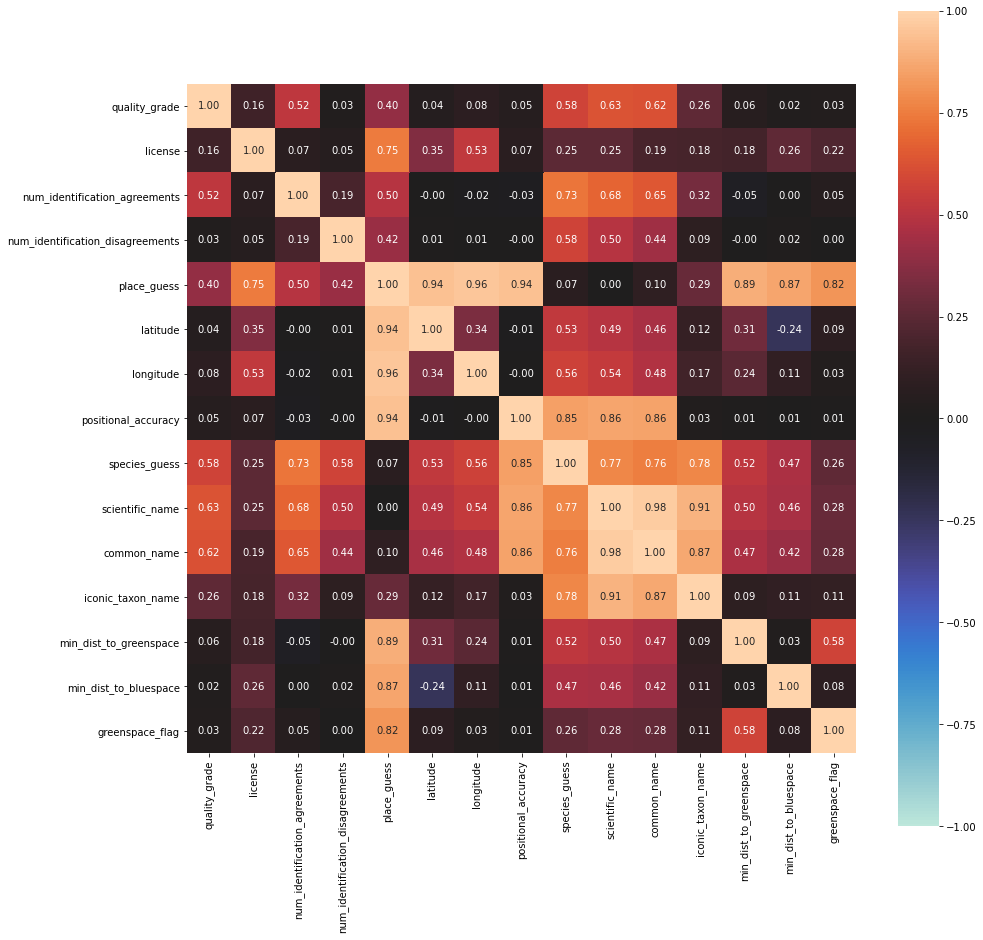

{'corr':                                   quality_grade   license  \
 quality_grade                          1.000000  0.157896   
 license                                0.157896  1.000000   
 num_identification_agreements          0.522085  0.072906   
 num_identification_disagreements       0.030438  0.050262   
 place_guess                            0.400372  0.747264   
 latitude                               0.042085  0.352594   
 longitude                              0.078400  0.525242   
 positional_accuracy                    0.051529  0.073940   
 species_guess                          0.576240  0.254517   
 scientific_name                        0.628445  0.252745   
 common_name                            0.617818  0.192548   
 iconic_taxon_name                      0.263518  0.183546   
 min_dist_to_greenspace                 0.059512  0.175960   
 min_dist_to_bluespace                  0.024847  0.261491   
 greenspace_flag                        0.031537  0.218727   


In [142]:
associations(data, theil_u=False, figsize=(15, 15))

## 9. Trajectories of users

Idea: plot trajectories of so-called super-users and users that do not contribute that much, to see if their moving behaviour is different.

In [143]:
# first get user ID with the most of observations for 2020
new_joined.head()

,observed_on,observed_on_string,time_observed_at,time_zone,user_id,user_login,created_at,updated_at,quality_grade,license,...,scientific_name,common_name,iconic_taxon_name,taxon_id,challenge,geometry,min_dist_to_greenspace,min_dist_to_bluespace,greenspace_flag,year
0,2018-04-29,Sun Apr 29 2018 11:07:52 GMT+0100 (GMT+1),2018-04-29 09:07:52+00:00,Amsterdam,908569,fieldmarshal,2018-04-29 10:08:44+00:00,2018-04-29 10:08:56+00:00,casual,0,...,Bambusoideae,bamboos,Plantae,201656.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (525839 180460),0.000000,0.887651,1,2018
1,2018-04-28,2018-04-28 2:40:20 pm BST,2018-04-28 14:40:20+00:00,UTC,911227,biologykate,2018-04-28 13:41:09+00:00,2018-04-28 13:41:17+00:00,casual,CC-BY,...,Wisteria,wisterias,Plantae,51267.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (525383 180150),0.195287,1.385144,0,2018
2,2018-04-28,Sat Apr 28 2018 11:15:24 GMT+0100 (GMT+1),2018-04-28 09:15:24+00:00,Amsterdam,353381,wildhamandpetersham,2018-04-28 13:38:07+00:00,2018-04-28 14:11:21+00:00,research,CC-BY-NC-ND,...,Corvus corone,Carrion Crow,Aves,204496.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (517010 173182),0.083983,0.062099,0,2018
3,2018-04-28,Sat Apr 28 2018 14:37:14 GMT+0100 (GMT+1),2018-04-28 12:37:14+00:00,Amsterdam,915491,heathhands,2018-04-28 13:37:37+00:00,2018-12-05 15:26:55+00:00,research,0,...,Anas platyrhynchos,Mallard,Aves,6930.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (527950 186286),0.000000,0.071663,1,2018
4,2018-04-28,Sat Apr 28 2018 09:22:20 GMT+0100 (GMT+1),2018-04-28 07:22:20+00:00,Amsterdam,353381,wildhamandpetersham,2018-04-28 13:36:13+00:00,2018-04-28 14:11:26+00:00,research,CC-BY-NC-ND,...,Phalacrocorax carbo,Great Cormorant,Aves,4270.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (517586 172078),0.000000,0.849839,1,2018


In [148]:
num_users = new_joined[new_joined.year == 2020].groupby('user_id')['observed_on'].count().to_frame().rename(columns={'observed_on':'num_observations'})

In [149]:
num_users.head()

,num_observations
user_id,
1245,2
1439,2
47920,2
137006,12
159021,134


In [157]:
max_user = num_users[num_users.num_observations == num_users.num_observations.max()].index.values[0]

In [158]:
max_user

1488476

In [159]:
max_user_df = new_joined.loc[(new_joined.year == 2020) & (new_joined.user_id == max_user)]

In [160]:
max_user_df.head()

,observed_on,observed_on_string,time_observed_at,time_zone,user_id,user_login,created_at,updated_at,quality_grade,license,...,scientific_name,common_name,iconic_taxon_name,taxon_id,challenge,geometry,min_dist_to_greenspace,min_dist_to_bluespace,greenspace_flag,year
7893,2020-04-25,2020-04-25 4:20:57 PM GMT+01:00,2020-04-25 14:20:57+00:00,Amsterdam,1488476,fsclondon,2020-04-25 15:26:50+00:00,2020-04-25 19:08:23+00:00,research,CC-BY-NC,...,Turdus philomelos,Song Thrush,Aves,12748.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (541309 198115),0.548409,0.654755,0,2020
7896,2020-04-25,2020-04-25 4:23:11 PM GMT+01:00,2020-04-25 14:23:11+00:00,Amsterdam,1488476,fsclondon,2020-04-25 15:27:33+00:00,2020-05-02 14:42:33+00:00,needs_id,CC-BY-NC,...,Bombus,Bumble Bees,Insecta,52775.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (541309 198115),0.548409,0.654755,0,2020
7901,2020-04-25,2020-04-25 4:28:23 PM GMT+01:00,2020-04-25 14:28:23+00:00,Amsterdam,1488476,fsclondon,2020-04-25 15:29:15+00:00,2020-05-01 13:57:15+00:00,research,CC-BY-NC,...,Buteo buteo,Common Buzzard,Aves,204472.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (541309 198115),0.548409,0.654755,0,2020
7910,2020-04-25,2020-04-25 4:00:49 PM GMT+01:00,2020-04-25 14:00:49+00:00,Amsterdam,1488476,fsclondon,2020-04-25 15:14:43+00:00,2020-05-02 14:42:59+00:00,needs_id,CC-BY-NC,...,Eratigena duellica,Giant House Spider,Arachnida,750907.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (541309 198115),0.548409,0.654755,0,2020
7915,2020-04-25,2020-04-25 4:01:31 PM GMT+01:00,2020-04-25 14:01:31+00:00,Amsterdam,1488476,fsclondon,2020-04-25 15:16:11+00:00,2020-04-25 15:19:18+00:00,needs_id,CC-BY-NC,...,Tracheophyta,vascular plants,Plantae,211194.0,/Users/florence/Desktop/citizen_science/muki_d...,POINT (541309 198115),0.548409,0.654755,0,2020


In [161]:
max_user_df.year.unique(), max_user_df.user_id.unique()

(array([2020]), array([1488476]))

In [163]:
max_user_df.time_observed_at = pd.to_datetime(max_user_df.time_observed_at)

/Users/florence/opt/anaconda3/envs/data_analysis/lib/python3.8/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [165]:
max_user_df = max_user_df[['time_observed_at', 'longitude', 'latitude']]
max_user_df.head()

,time_observed_at,longitude,latitude
7893,2020-04-25 14:20:57+00:00,0.041773,51.664056
7896,2020-04-25 14:23:11+00:00,0.041773,51.664056
7901,2020-04-25 14:28:23+00:00,0.041773,51.664056
7910,2020-04-25 14:00:49+00:00,0.041773,51.664056
7915,2020-04-25 14:01:31+00:00,0.041773,51.664056


In [168]:
import movingpandas as mpd

In [170]:
max_user_df.set_index('time_observed_at', inplace=True)

In [171]:
max_user_df.head()

,longitude,latitude
time_observed_at,,
2020-04-25 14:20:57+00:00,0.041773,51.664056
2020-04-25 14:23:11+00:00,0.041773,51.664056
2020-04-25 14:28:23+00:00,0.041773,51.664056
2020-04-25 14:00:49+00:00,0.041773,51.664056
2020-04-25 14:01:31+00:00,0.041773,51.664056


In [173]:
geometry = [Point(xy) for xy in zip(max_user_df.longitude, max_user_df.latitude)]
#new_df = london_df.drop(['E', 'N'], axis=1)
gdf = GeoDataFrame(max_user_df, crs="epsg:4326", geometry=geometry)

In [174]:
gdf.head()

,longitude,latitude,geometry
time_observed_at,,,
2020-04-25 14:20:57+00:00,0.041773,51.664056,POINT (0.04177 51.66406)
2020-04-25 14:23:11+00:00,0.041773,51.664056,POINT (0.04177 51.66406)
2020-04-25 14:28:23+00:00,0.041773,51.664056,POINT (0.04177 51.66406)
2020-04-25 14:00:49+00:00,0.041773,51.664056,POINT (0.04177 51.66406)
2020-04-25 14:01:31+00:00,0.041773,51.664056,POINT (0.04177 51.66406)


In [175]:
traj = mpd.Trajectory(gdf, 1)

In [182]:
traj.hvplot(c='speed', line_width=5.0, width=1000, height=600, colorbar=True, geo=True)

:Overlay
   .Tiles.I :Tiles   [x,y]
   .Path.I  :Path   [Longitude,Latitude]   (speed)

## Ideas to implement
* more than one trajectory in one plot (eg. first 10 most contributing users)
* mean trajectory length for top users and not-top users (is there a significant difference in the way the users move and does this influence their contribution behaviour?) 

### More than one trajectory in one plot 

In [183]:
num_users.head()

,num_observations
user_id,
1245,2
1439,2
47920,2
137006,12
159021,134


In [184]:
# select top 10 contributors 
top_ten_users = num_users.nlargest(10, 'num_observations')

In [226]:
top_ten_users

,num_observations
user_id,
1488476,353
2782355,299
353381,274
1624432,184
908569,183
2835215,161
159021,134
1653354,131
2829130,131


In [274]:
import numpy as np
test = np.zeros(4)
start_df = pd.Series(test).to_frame().T.rename(columns={0:'time_observed_at', 1:'longitude', 2:'latitude', 3:'user_id'})
start_df

,time_observed_at,longitude,latitude,user_id
0,0.0,0.0,0.0,0.0


In [275]:
for uid in top_ten_users.index.values.tolist():
    print(uid)
    uid_df = new_joined.loc[(new_joined.year == 2020) & (new_joined.user_id == uid)][['time_observed_at', 'longitude', 'latitude', 'user_id']]
    start_df = pd.concat([start_df, uid_df])

1488476
2782355
353381
1624432
908569
2835215
159021
1653354
2829130
2838930


In [276]:
start_df = start_df.iloc[1:]

In [277]:
start_df['time_observed_at'] = pd.to_datetime(start_df['time_observed_at'], utc=True, errors='coerce')
start_df = start_df[start_df['time_observed_at'].notnull()]

In [279]:
start_df[['user_id']] = start_df[['user_id']].astype(int)
start_df.head()

,time_observed_at,longitude,latitude,user_id
7893,2020-04-25 14:20:57+00:00,0.041773,51.664056,1488476
7896,2020-04-25 14:23:11+00:00,0.041773,51.664056,1488476
7901,2020-04-25 14:28:23+00:00,0.041773,51.664056,1488476
7910,2020-04-25 14:00:49+00:00,0.041773,51.664056,1488476
7915,2020-04-25 14:01:31+00:00,0.041773,51.664056,1488476


In [280]:
from fiona.crs import from_epsg
geometry = [Point(xy) for xy in zip(start_df.longitude, start_df.latitude)]
gdf_top_ten = GeoDataFrame(start_df, crs=from_epsg(4326), geometry=geometry)

In [281]:
gdf_top_ten.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1652 entries, 7893 to 11431
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype              
---  ------            --------------  -----              
 0   time_observed_at  1652 non-null   datetime64[ns, UTC]
 1   longitude         1652 non-null   float64            
 2   latitude          1652 non-null   float64            
 3   user_id           1652 non-null   int64              
 4   geometry          1652 non-null   geometry           
dtypes: datetime64[ns, UTC](1), float64(2), geometry(1), int64(1)
memory usage: 77.4 KB


In [282]:
gdf_top_ten.set_index('time_observed_at', inplace=True)
gdf_top_ten.head()

,longitude,latitude,user_id,geometry
time_observed_at,,,,
2020-04-25 14:20:57+00:00,0.041773,51.664056,1488476,POINT (0.04177 51.66406)
2020-04-25 14:23:11+00:00,0.041773,51.664056,1488476,POINT (0.04177 51.66406)
2020-04-25 14:28:23+00:00,0.041773,51.664056,1488476,POINT (0.04177 51.66406)
2020-04-25 14:00:49+00:00,0.041773,51.664056,1488476,POINT (0.04177 51.66406)
2020-04-25 14:01:31+00:00,0.041773,51.664056,1488476,POINT (0.04177 51.66406)


In [283]:
trajectory_collection = mpd.TrajectoryCollection(gdf_top_ten, 'user_id')

/Users/florence/opt/anaconda3/envs/data_analysis/lib/python3.8/site-packages/movingpandas/trajectory.py:80: MissingCRSWarning:

Trajectory generated without CRS! Computations will use Euclidean distances.

/Users/florence/opt/anaconda3/envs/data_analysis/lib/python3.8/site-packages/movingpandas/trajectory.py:80: MissingCRSWarning:

Trajectory generated without CRS! Computations will use Euclidean distances.

/Users/florence/opt/anaconda3/envs/data_analysis/lib/python3.8/site-packages/movingpandas/trajectory.py:80: MissingCRSWarning:

Trajectory generated without CRS! Computations will use Euclidean distances.

/Users/florence/opt/anaconda3/envs/data_analysis/lib/python3.8/site-packages/movingpandas/trajectory.py:80: MissingCRSWarning:

Trajectory generated without CRS! Computations will use Euclidean distances.

/Users/florence/opt/anaconda3/envs/data_analysis/lib/python3.8/site-packages/movingpandas/trajectory.py:80: MissingCRSWarning:

Trajectory generated without CRS! Computations w

In [257]:
trajectory_collection.hvplot(c='speed', line_width=5.0, width=1000, height=600, colorbar=True)

/Users/florence/opt/anaconda3/envs/data_analysis/lib/python3.8/site-packages/movingpandas/trajectory.py:80: MissingCRSWarning:

Trajectory generated without CRS! Computations will use Euclidean distances.



ValueError: Cannot transform naive geometries.  Please set a crs on the object first.